In [1]:
import pandas as pd
from pandas_profiling import ProfileReport
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

In [2]:
df = pd.read_csv("squad-stats.csv")

In [3]:
df

,Squad,Comp,PlayersUsed,Gls,Sh,SoT,SoTpercent,ShotsPer90,SoTper90,GoalsPerShot,GoalsPerSoT,FK,PK,PKatt,xG,npxG,npxGperShot,GxGDiff,npGxGDiff
0,Napoli,Serie A,22,14,74,34,45.9,18.50,8.50,0.19,0.41,2,0,0,7.9,7.9,0.11,6.1,6.1
1,Bayern Munich,Bundesliga,23,22,95,40,42.1,19.00,8.00,0.21,0.50,4,2,2,16.5,15.0,0.16,5.5,5.0
2,Atalanta,Serie A,20,15,80,33,41.3,16.00,6.60,0.18,0.42,4,1,1,9.9,9.2,0.12,5.1,4.8
3,Benevento,Serie A,20,9,50,19,38.0,10.00,3.80,0.18,0.47,3,0,1,6.0,5.0,0.10,3.0,4.0
4,Montpellier,Ligue 1,22,13,88,35,39.8,11.00,4.37,0.13,0.31,5,2,2,8.5,7.0,0.08,4.5,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93,Udinese,Serie A,24,4,76,22,28.9,15.20,4.40,0.05,0.18,0,0,0,7.7,7.7,0.10,-3.7,-3.7
94,Celta Vigo,La Liga,20,4,79,25,31.6,11.29,3.57,0.05,0.16,5,0,0,7.2,7.2,0.09,-4.2,-4.2
95,Lens,Ligue 1,23,10,85,27,31.8,12.14,3.86,0.07,0.22,5,4,4,13.4,10.3,0.13,-3.4,-4.3
96,Real Madrid,La Liga,24,8,83,23,27.7,13.83,3.83,0.07,0.26,1,2,2,12.3,10.8,0.13,-4.3,-4.8


In [15]:
profile = ProfileReport(df, title='Pandas Profiling Report', explorative=True)

In [17]:
profile.to_notebook_iframe()

Render HTML: 100%|██████████| 1/1 [00:05<00:00,  5.54s/it]


In [4]:
xvalues = ['Serie A', 'Bundesliga', 'Ligue 1', 'Premier\nLeague', 'La Liga']

In [5]:
matplotlib.rcParams['font.sans-serif'] = "Roboto Condensed"
matplotlib.rcParams['font.family'] = "sans-serif"

Text(0.09, -0.225, 'Source: FB Ref/StatsBomb')

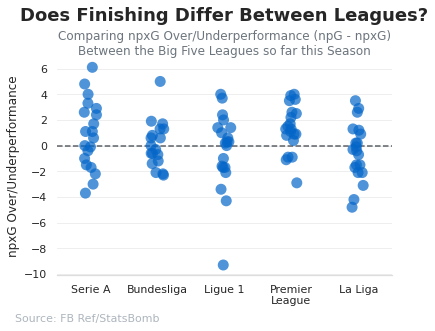

In [7]:
fig, ax = plt.subplots()
sns.set_theme(style="whitegrid")
ax = sns.stripplot(
     data=df,x='Comp', y='npGxGDiff',
     color="#0466c8", alpha=0.7,
     size = 11, jitter=0.1)
ax.set(xlabel='', ylabel='npxG Over/Underperformance')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_color('#DDDDDD')
ax.set_xticklabels(xvalues)
ax.set_axisbelow(True)
ax.yaxis.grid(True, color='#EEEEEE')
ax.xaxis.grid(False)
plt.axhline(y=0, color='#343a40', linestyle='--', alpha = 0.8)



ax.text(x=0.5, y=1.15, s="Does Finishing Differ Between Leagues?", fontsize=18, weight='bold', ha='center', va='bottom', transform=ax.transAxes)
ax.text(x=0.5, y=1.0, s='Comparing npxG Over/Underperformance (npG - npxG)\nBetween the Big Five Leagues so far this Season', fontsize=12, color='#6c757d', ha='center', va='bottom', transform=ax.transAxes)
ax.text(x=0.09, y=-0.225, s='Source: FB Ref/StatsBomb', fontsize=11, color='#adb5bd', ha='center', va='bottom', transform=ax.transAxes)

In [9]:
yvalues = [0, 2, 4, 6, 8, 10,
           12, 14, 16, 18]

Text(0.125, -0.25, 'Source: FB Ref/StatsBomb')

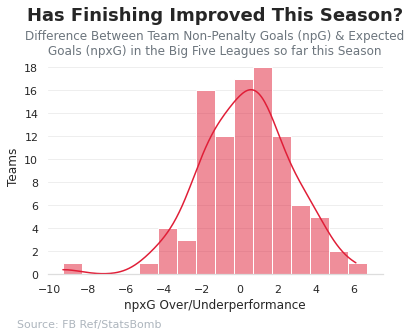

In [10]:
sns.set_theme(style="whitegrid")
ax = sns.histplot(data=df, x='npGxGDiff', color="#E01E37", kde=True, binwidth=1)
ax.set(xlabel='npxG Over/Underperformance', ylabel='Teams')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_color('#DDDDDD')
ax.set_axisbelow(True)
ax.set_yticks(yvalues)
ax.yaxis.grid(True, color='#EEEEEE')
ax.xaxis.grid(False)

ax.text(x=0.5, y=1.15, s="Has Finishing Improved This Season?", fontsize=18, weight='bold', ha='center', va='bottom', transform=ax.transAxes)
ax.text(x=0.5, y=1.0, s="Difference Between Team Non-Penalty Goals (npG) & Expected\nGoals (npxG) in the Big Five Leagues so far this Season", fontsize=12, color='#6c757d', ha='center', va='bottom', transform=ax.transAxes)
ax.text(x=0.125, y=-0.25, s='Source: FB Ref/StatsBomb', fontsize=11, color='#adb5bd', ha='center', va='bottom', transform=ax.transAxes)

In [24]:
dfNoFans = df[(df.Comp.isin(["Premier League", "La Liga"]))]

In [25]:
dfFans = df[(df.Comp.isin(["Ligue 1", "Bundesliga", "Serie A"]))]

In [29]:
stats.ttest_ind(dfNoFans['npGxGDiff'], dfFans['npGxGDiff'], equal_var = False)

Ttest_indResult(statistic=0.4698148387101395, pvalue=0.6396060328307092)